In [1]:
!pip install xgboost

In [2]:
import pandas as pd

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
color_pal = sns.color_palette()
plt.style.use('fivethirtyeight')

In [5]:
df = pd.read_csv('data/dataset.csv')

In [6]:
df = df.set_index('Datetime')
df.index = pd.to_datetime(df.index)

In [7]:
df.head()

,PJME_MW
Datetime,
2002-12-31 01:00:00,26498.0
2002-12-31 02:00:00,25147.0
2002-12-31 03:00:00,24574.0
2002-12-31 04:00:00,24393.0
2002-12-31 05:00:00,24860.0


In [8]:
df.plot(style='o',
        figsize=(200, 100),
        color=color_pal[3],
        title='PJME Energy Use in MW')
plt.savefig('my_plot.png')

<Axes: ylabel='Frequency'>

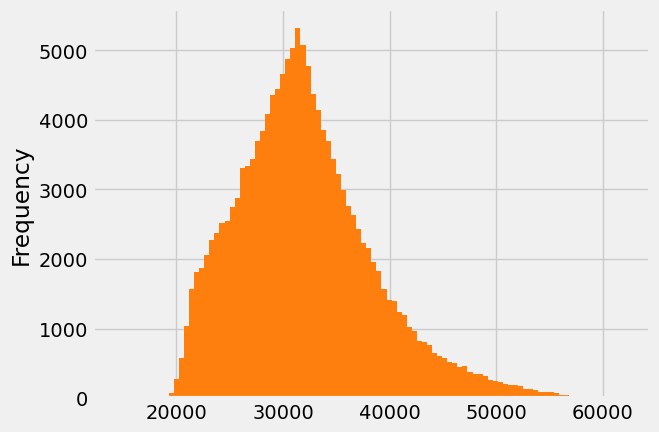

In [9]:
df['PJME_MW'].plot(kind='hist',color=color_pal[1], bins=100)

<Axes: title={'center': 'Outliers'}, xlabel='Datetime'>

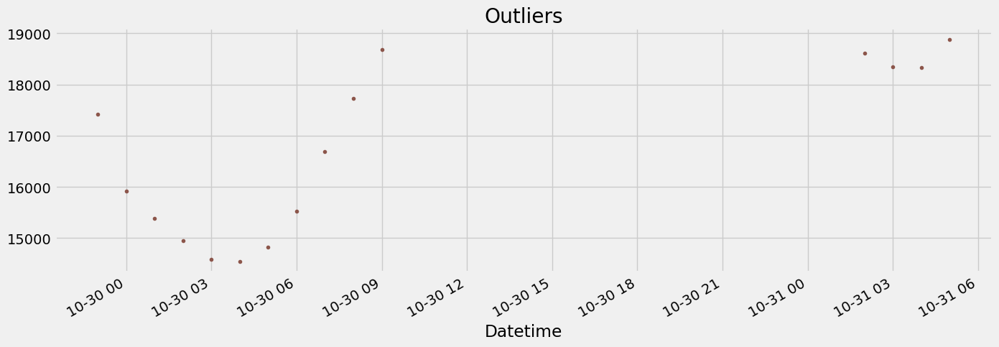

In [10]:
df.query('PJME_MW < 19_000 ')['PJME_MW'] \
    .plot(style='.',
          figsize=(15, 5),
          color=color_pal[5],
          title='Outliers')

In [11]:
df = df.query('PJME_MW > 19_000').copy()

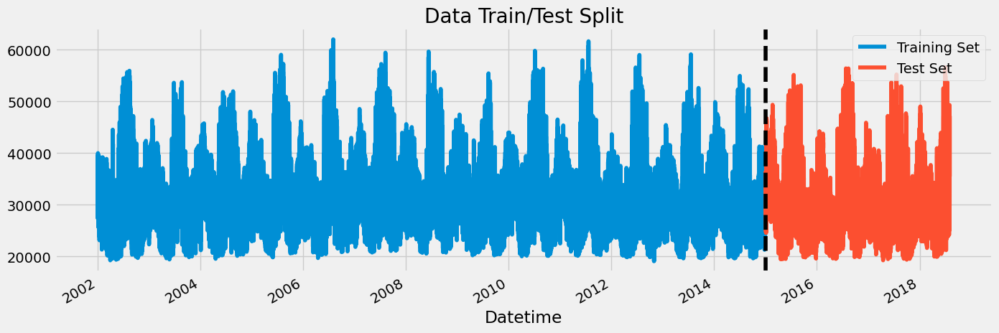

In [12]:
train = df.loc[df.index < '01-01-2015']
test = df.loc[df.index >= '01-01-2015']

fig, ax = plt.subplots(figsize=(15, 5))
train.plot(ax=ax, label='Training Set', title='Data Train/Test Split')
test.plot(ax=ax, label='Test Set')
ax.axvline('01-01-2015', color='black', ls='--')
ax.legend(['Training Set', 'Test Set'])
plt.show()

In [13]:
from sklearn.model_selection import TimeSeriesSplit

tss = TimeSeriesSplit(n_splits=10, test_size=24*365*1, gap=24)
df = df.sort_index()

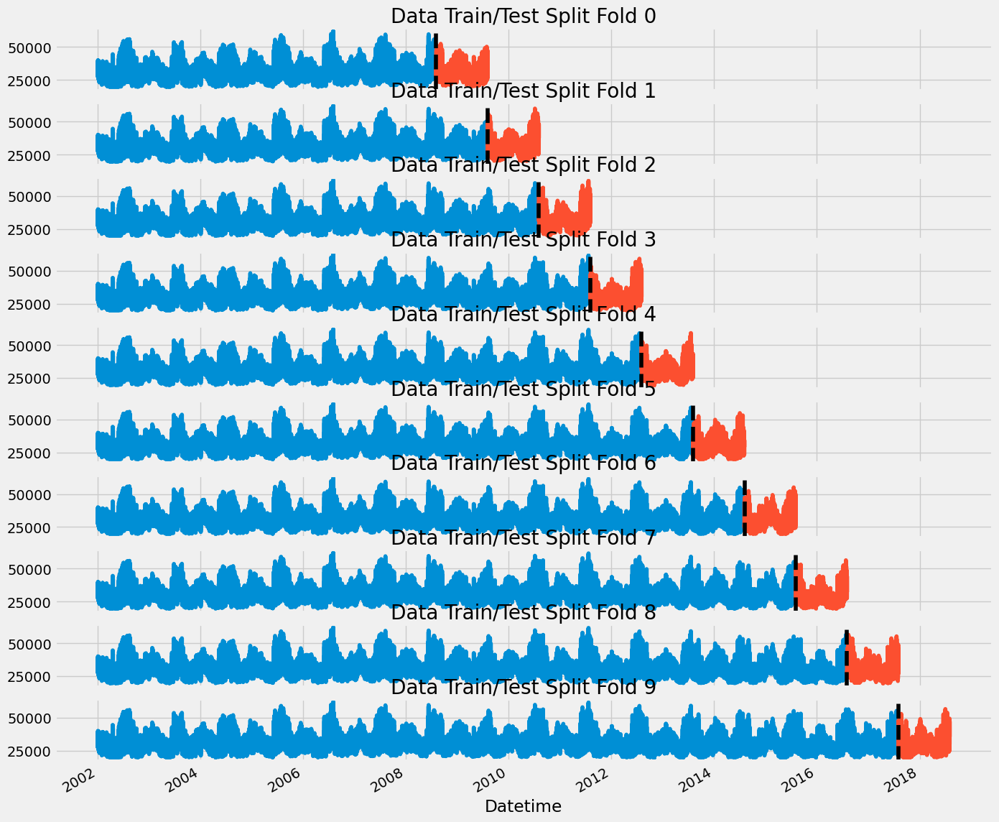

In [14]:
fig, axs = plt.subplots(10, 1, figsize=(15, 15), sharex=True)

fold = 0
for train_idx, val_idx in tss.split(df):
    train = df.iloc[train_idx]
    test = df.iloc[val_idx]
    train['PJME_MW'].plot(ax=axs[fold],
                          label='Training Set',
                          title=f'Data Train/Test Split Fold {fold}')
    test['PJME_MW'].plot(ax=axs[fold],
                         label='Test Set')
    axs[fold].axvline(test.index.min(), color='black', ls='--')
    fold += 1
plt.show()


In [15]:
def create_features(df):
    """
    Create time series features based on time series index.
    """
    df = df.copy()
    df['hour'] = df.index.hour
    df['date']= df.index.date
    df['dayofweek'] = df.index.dayofweek
    df['quarter'] = df.index.quarter
    df['month'] = df.index.month
    df['year'] = df.index.year
    df['dayofyear'] = df.index.dayofyear
    df['dayofmonth'] = df.index.day
    df['weekofyear'] = df.index.isocalendar().week
    return df

df = create_features(df)
df = df.astype({'date':'string'})
df['month_day'] = df['date'].str[5:10]
df = df.astype({'month_day':'string'})


In [16]:
df.head(24*7)

,PJME_MW,hour,date,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,month_day
Datetime,,,,,,,,,,,
2002-01-01 01:00:00,30393.0,1,2002-01-01,1,1,1,2002,1,1,1,01-01
2002-01-01 02:00:00,29265.0,2,2002-01-01,1,1,1,2002,1,1,1,01-01
2002-01-01 03:00:00,28357.0,3,2002-01-01,1,1,1,2002,1,1,1,01-01
2002-01-01 04:00:00,27899.0,4,2002-01-01,1,1,1,2002,1,1,1,01-01
2002-01-01 05:00:00,28057.0,5,2002-01-01,1,1,1,2002,1,1,1,01-01
...,...,...,...,...,...,...,...,...,...,...,...
2002-01-07 20:00:00,38780.0,20,2002-01-07,0,1,1,2002,7,7,2,01-07
2002-01-07 21:00:00,37777.0,21,2002-01-07,0,1,1,2002,7,7,2,01-07
2002-01-07 22:00:00,35997.0,22,2002-01-07,0,1,1,2002,7,7,2,01-07


In [17]:
def add_lags(df):
    target_map = df['PJME_MW'].to_dict()
    df['lag1'] = (df.index - pd.Timedelta('364 days')).map(target_map)
    df['lag2'] = (df.index - pd.Timedelta('728 days')).map(target_map)
    df['lag3'] = (df.index - pd.Timedelta('1092 days')).map(target_map)
    return df

In [18]:
# List of specific dates to filter and flag
date_list = [
    "01-01", "02-01", "03-01",
    "06-01", "07-01", "08-01", "01-13", "01-14", "01-16", "01-19", "01-22", "01-29",
    "02-01", "02-02", "02-03", "02-04", "02-06", "02-12", "02-13", "02-14", "02-15", "02-16", "02-18", "02-20", "02-21", "02-22", "02-25", "02-28",
    "03-01", "03-02", "03-03", "03-04", "03-06", "03-07", "03-12", "03-17", "03-20", "03-23", "03-25", "03-26", "03-27", "03-29", "03-30", "03-31",
    "04-02", "04-03", "04-05", "04-06", "04-07", "04-08", "04-09", "04-10", "04-13", "04-14", "04-15", "04-16", "04-17", "04-18", "04-21", "04-22", "04-24", "04-25", "04-26", "04-27", "04-28",
    "05-01", "05-02", "05-04", "05-05", "05-06", "05-08", "05-09", "05-10", "05-12", "05-14", "05-15", "05-18", "05-19", "05-20", "05-22", "05-24", "05-25", "05-26", "05-28", "05-29",
    "06-01", "06-03", "06-04", "06-05", "06-06", "06-08", "06-10", "06-11", "06-12", "06-14", "06-16", "06-17", "06-18", "06-19", "06-20", "06-21", "06-28",
    "07-03", "07-04", "07-13", "07-14", "07-16", "07-19", "07-23", "07-24", "07-27", "07-28",
    "08-01", "08-04", "08-06", "08-07", "08-14", "08-15", "08-16", "08-18", "08-19", "08-20", "08-26", "08-27", "08-30",
    "09-04", "09-06", "09-09", "09-10", "09-11", "09-15", "09-16", "09-17", "09-18", "09-22", "09-23", "09-24", "09-25", "09-28", "09-29", "09-30",
    "10-02", "10-04", "10-06", "10-07", "10-08", "10-09", "10-11", "10-13", "10-14", "10-15", "10-16", "10-18", "10-21", "10-23", "10-27", "10-31",
    "11-01", "11-02", "11-05", "11-07", "11-10", "11-11", "11-12", "11-13", "11-19", "11-23", "11-24", "11-27", "11-28", "11-29",
    "12-01", "12-03", "12-06", "12-07", "12-08", "12-10", "12-12", "12-13", "12-15", "12-17", "12-21", "12-22", "12-24", "12-25", "12-26", "12-31"
]

# Create a new column "flag_column" and use boolean indexing to flag specific dates
df['flag_column'] = df['month_day'].isin(date_list).astype(int)
df = add_lags(df)

# Display the updated DataFrame
print(df)


                     PJME_MW  hour        date  dayofweek  quarter  month  \
Datetime                                                                    
2002-01-01 01:00:00  30393.0     1  2002-01-01          1        1      1   
2002-01-01 02:00:00  29265.0     2  2002-01-01          1        1      1   
2002-01-01 03:00:00  28357.0     3  2002-01-01          1        1      1   
2002-01-01 04:00:00  27899.0     4  2002-01-01          1        1      1   
2002-01-01 05:00:00  28057.0     5  2002-01-01          1        1      1   
...                      ...   ...         ...        ...      ...    ...   
2018-08-02 20:00:00  44057.0    20  2018-08-02          3        3      8   
2018-08-02 21:00:00  43256.0    21  2018-08-02          3        3      8   
2018-08-02 22:00:00  41552.0    22  2018-08-02          3        3      8   
2018-08-02 23:00:00  38500.0    23  2018-08-02          3        3      8   
2018-08-03 00:00:00  35486.0     0  2018-08-03          4        3      8   

In [19]:
len(date_list)

187

In [20]:
df.to_csv("df_pro.csv", index=False)


In [21]:
df.dtypes

PJME_MW               float64
hour                    int32
date           string[python]
dayofweek               int32
quarter                 int32
month                   int32
year                    int32
dayofyear               int32
dayofmonth              int32
weekofyear             UInt32
month_day      string[python]
flag_column             int32
lag1                  float64
lag2                  float64
lag3                  float64
dtype: object

In [22]:
df.flag_column.value_counts()

flag_column
1    72875
0    72476
Name: count, dtype: int64

In [23]:
df.head()

,PJME_MW,hour,date,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,month_day,flag_column,lag1,lag2,lag3
Datetime,,,,,,,,,,,,,,,
2002-01-01 01:00:00,30393.0,1,2002-01-01,1,1,1,2002,1,1,1,01-01,1,NaN,NaN,NaN
2002-01-01 02:00:00,29265.0,2,2002-01-01,1,1,1,2002,1,1,1,01-01,1,NaN,NaN,NaN
2002-01-01 03:00:00,28357.0,3,2002-01-01,1,1,1,2002,1,1,1,01-01,1,NaN,NaN,NaN
2002-01-01 04:00:00,27899.0,4,2002-01-01,1,1,1,2002,1,1,1,01-01,1,NaN,NaN,NaN
2002-01-01 05:00:00,28057.0,5,2002-01-01,1,1,1,2002,1,1,1,01-01,1,NaN,NaN,NaN


C:\Users\kumar\AppData\Local\Temp\ipykernel_79608\58746644.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='hour', y='PJME_MW',palette='rocket')


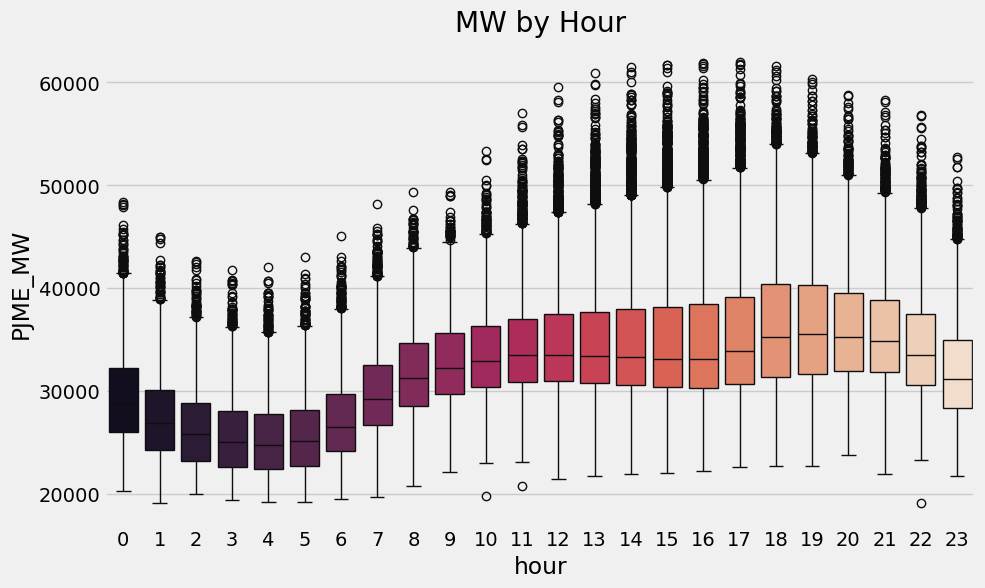

<Figure size 640x480 with 0 Axes>

In [24]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.boxplot(data=df, x='hour', y='PJME_MW',palette='rocket')
ax.set_title('MW by Hour')
plt.show()
plt.savefig('hour.png')

C:\Users\kumar\AppData\Local\Temp\ipykernel_79608\3787137676.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='dayofweek', y='PJME_MW',palette='viridis')


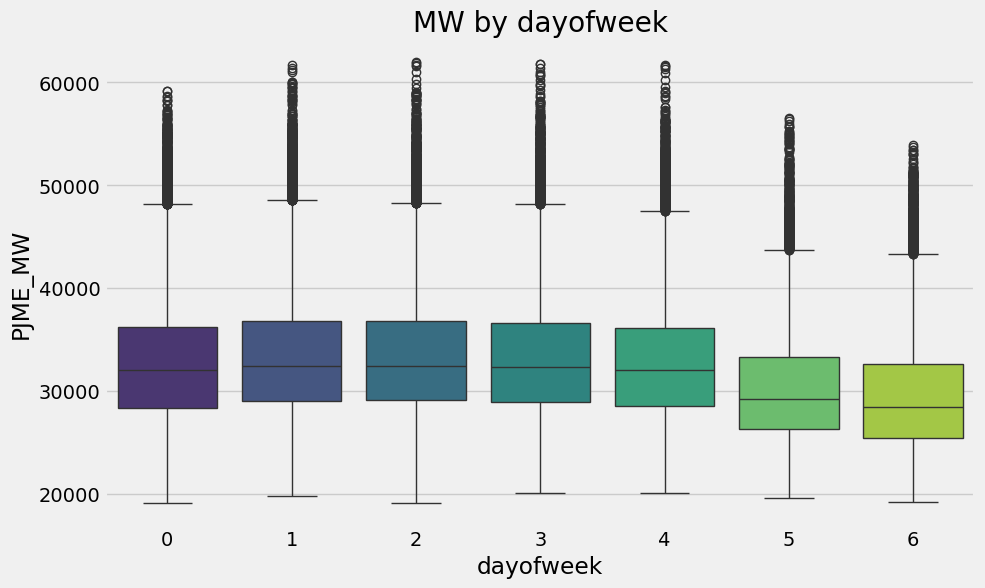

<Figure size 640x480 with 0 Axes>

In [25]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.boxplot(data=df, x='dayofweek', y='PJME_MW',palette='viridis')
ax.set_title('MW by dayofweek')
plt.show()
plt.savefig('dayofweek.png')

C:\Users\kumar\AppData\Local\Temp\ipykernel_79608\3586158678.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='month', y='PJME_MW',palette='mako')


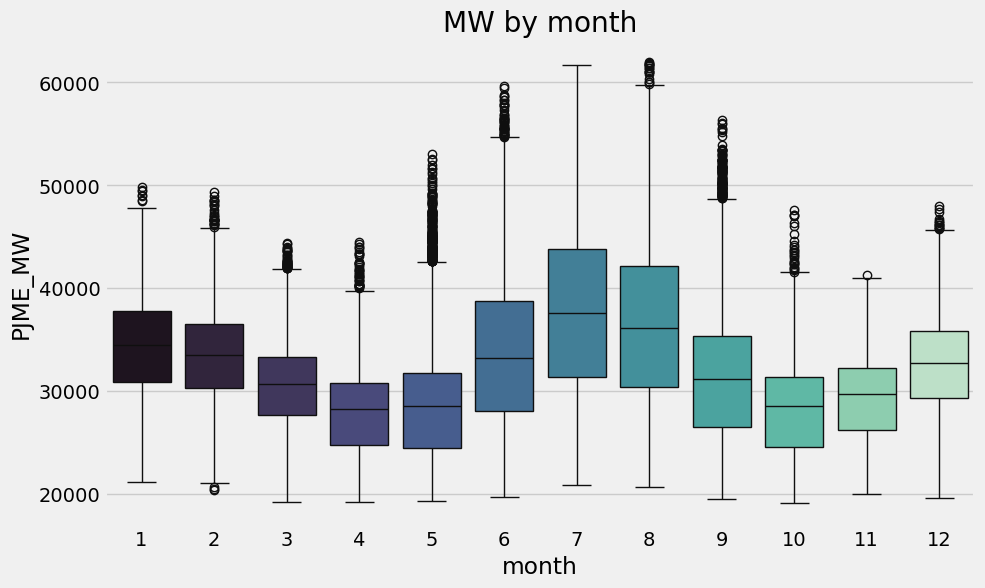

<Figure size 640x480 with 0 Axes>

In [26]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.boxplot(data=df, x='month', y='PJME_MW',palette='mako')
ax.set_title('MW by month')
plt.show()
plt.savefig('month.png')

C:\Users\kumar\AppData\Local\Temp\ipykernel_79608\4225370868.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='dayofmonth', y='PJME_MW',palette='vlag')


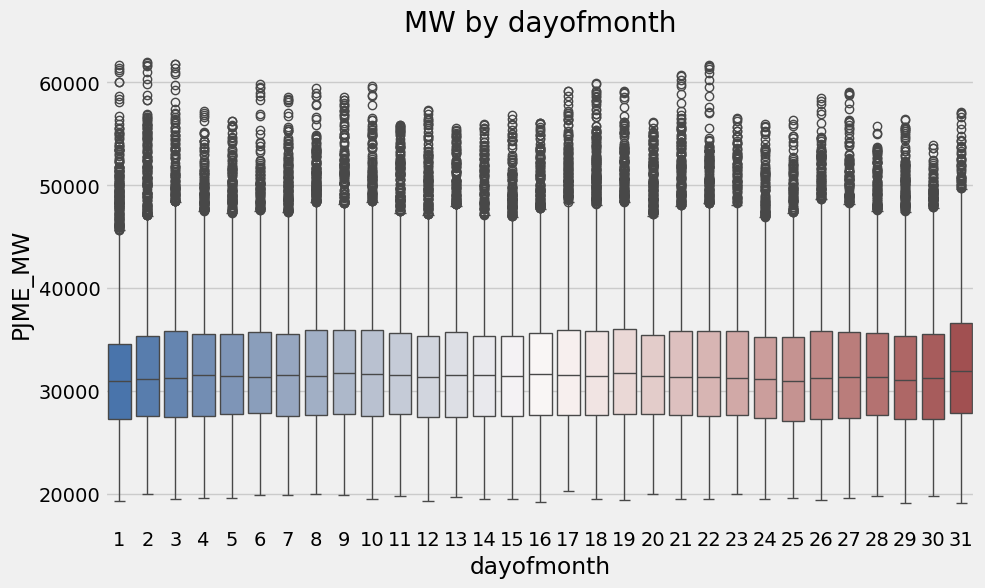

<Figure size 640x480 with 0 Axes>

In [27]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.boxplot(data=df, x='dayofmonth', y='PJME_MW',palette='vlag')
ax.set_title('MW by dayofmonth')
plt.show()
plt.savefig('dayofmonth.png')